# Willliam Stern

# AI Generated Music

# Dec 14, 2021

For this final project I want to try and generate music using LSTM. I used MIDI files as inputs. MIDI files are very simple representaions of musical scores. The contain the not, note start time, note end time, and volume. I decided to use the noe, note start time, and durations of the mote as the peoture of the neural netowrk. Those will also be thing things that the network outputs. 

In [72]:
import collections
import datetime
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf
from tqdm import tqdm
from IPython import display
from matplotlib import pyplot as plt
from typing import Dict, List, Optional, Sequence, Tuple
from IPython.display import Audio
import random
from keras_self_attention import SeqSelfAttention

I found this guide from the tensorflow team and the Magenta research team. I borrowed some fuctions from this and I also used it as the base for my model. https://www.tensorflow.org/tutorials/audio/music_generation

Here I input a midi file to test

In [2]:
midi_data = pretty_midi.PrettyMIDI("E:/Datasets/midis_v1.1/Gershwin, George, Idle Dreams, qyrVxxzWn1w.mid")

Cool embedding

In [3]:


Fs = 22050
audio_data = midi_data.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)



This next func will take all the note data out of the midid file and put in in a pandas dataframe

In [4]:
def midi_to_notes(midi_file: str) -> pd.DataFrame:
    pm = pretty_midi.PrettyMIDI(midi_file)
    instrument = pm.instruments[0]
    notes = collections.defaultdict(list)

    # Sort the notes by start time
    sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
    prev_start = sorted_notes[0].start

    for note in sorted_notes:
        start = note.start
        end = note.end
        notes['pitch'].append(note.pitch)
        notes['start'].append(start)
        notes['end'].append(end)
        notes['step'].append(start - prev_start)
        notes['duration'].append(end - start)
        prev_start = start

    return pd.DataFrame({name: np.array(value) for name, value in notes.items()})


In [5]:
raw_notes = midi_to_notes("E:/Datasets/midis_v1.1/Gershwin, George, Idle Dreams, qyrVxxzWn1w.mid")
raw_notes.head()


,pitch,start,end,step,duration
0,48,0.317708,0.382812,0.000000,0.065104
1,41,0.321615,0.609375,0.003906,0.287760
2,57,0.322917,0.384115,0.001302,0.061198
3,88,0.322917,0.433594,0.000000,0.110677
4,76,0.324219,0.415365,0.001302,0.091146


I can plot the notes to visualizwe it

In [6]:
def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
    if count:
        title = f'First {count} notes'
    else:
        title = f'Whole track'
        count = len(notes['pitch'])
        plt.figure(figsize=(20, 4))
        plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
        plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
        plt.plot(
          plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
        plt.xlabel('Time [s]')
        plt.ylabel('Pitch')
        _ = plt.title(title)


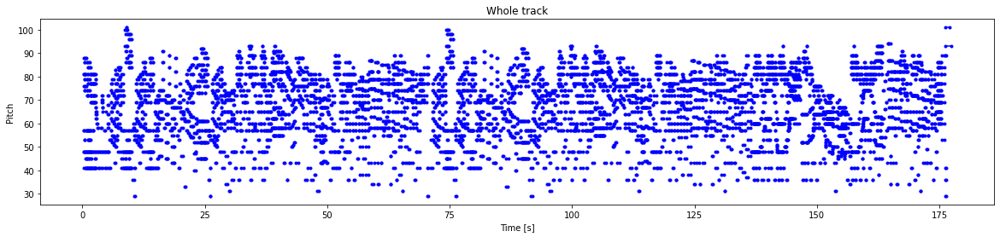

In [7]:
plot_piano_roll(raw_notes)

In [8]:
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
    plt.figure(figsize=[15, 5])
    plt.subplot(1, 3, 1)
    sns.histplot(notes, x="pitch", bins=20)

    plt.subplot(1, 3, 2)
    max_step = np.percentile(notes['step'], 100 - drop_percentile)
    sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))

    plt.subplot(1, 3, 3)
    max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
    sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))


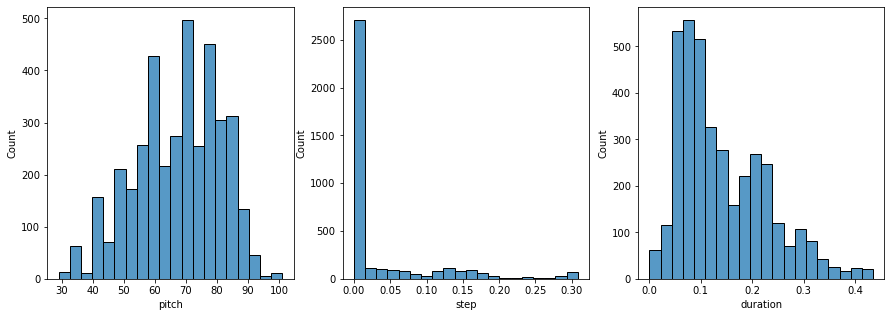

In [9]:
plot_distributions(raw_notes)

This will get 100 midid files

In [10]:
num_files = 100
all_notes = []
filenames = glob.glob("E:/Datasets/midis_v1.1/*.mid")
random.shuffle(filenames)
for f in tqdm(filenames[:num_files]):
    notes = midi_to_notes(f)
    all_notes.append(notes)

all_notes = pd.concat(all_notes)


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.93it/s]


In [11]:
n_notes = len(all_notes)
print('Number of notes parsed:', n_notes)

Number of notes parsed: 327551


In [12]:
instrument = midi_data.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
print('Instrument name:', instrument_name)

Instrument name: Acoustic Grand Piano


In [13]:
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)


In [14]:
notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

TensorSpec(shape=(3,), dtype=tf.float64, name=None)

In [15]:
def create_sequences(
    dataset: tf.data.Dataset, 
    seq_length: int,
    vocab_size = 128,
    ) -> tf.data.Dataset:
    """Returns TF Dataset of sequence and label examples."""
    seq_length = seq_length+1

    # Take 1 extra for the labels
    windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)

    # `flat_map` flattens the" dataset of datasets" into a dataset of tensors
    flatten = lambda x: x.batch(seq_length, drop_remainder=True)
    sequences = windows.flat_map(flatten)

  # Normalize note pitch
    def scale_pitch(x):
        x = x/[vocab_size,1.0,1.0]
        return x

  # Split the labels
    def split_labels(sequences):
        inputs = sequences[:-1]
        labels_dense = sequences[-1]
        labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

        return scale_pitch(inputs), labels

    return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)


In [16]:
seq_length = 50
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

(TensorSpec(shape=(50, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})

In [17]:
for seq, target in seq_ds.take(1):
    print('sequence shape:', seq.shape)
    print('sequence elements (first 10):', seq[0: 10])
    print()
    print('target:', target)


sequence shape: (50, 3)
sequence elements (first 10): tf.Tensor(
[[0.3359375  0.         3.69401042]
 [0.390625   0.43359375 3.26692708]
 [0.4296875  0.30729167 2.95833333]
 [0.4609375  0.265625   2.69270833]
 [0.484375   0.27473958 0.78255208]
 [0.5234375  0.23697917 0.84635417]
 [0.578125   0.29036458 1.89322917]
 [0.484375   0.26302083 0.96223958]
 [0.5234375  0.29817708 0.984375  ]
 [0.4453125  0.00390625 1.32552083]], shape=(10, 3), dtype=float64)

target: {'pitch': <tf.Tensor: shape=(), dtype=float64, numpy=52.0>, 'step': <tf.Tensor: shape=(), dtype=float64, numpy=0.28125>, 'duration': <tf.Tensor: shape=(), dtype=float64, numpy=2.755208333333332>}


In [18]:
batch_size = 50
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))


In [19]:
train_ds.element_spec

(TensorSpec(shape=(50, 50, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(50,), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(50,), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(50,), dtype=tf.float64, name=None)})

This modofied loss fucntion keeps the start time and duration from going negetive

In [20]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
    mse = (y_true - y_pred) ** 2
    positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
    return tf.reduce_mean(mse + positive_pressure)


Start out with just one LSTM layer

In [731]:
input_shape = (seq_length, 3)
learning_rate = 0.002
print(input_shape)
inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128)(inputs)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

(100, 3)


In [22]:


model = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model.compile(loss=loss, optimizer=optimizer)

model.summary()


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 50, 3)]      0                                            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 128)          67584       input_1[0][0]                    
__________________________________________________________________________________________________
duration (Dense)                (None, 1)            129         lstm[0][0]                       
__________________________________________________________________________________________________
pitch (Dense)                   (None, 128)          16512       lstm[0][0]                       
______________________________________________________________________________________________

In [23]:
losses = model.evaluate(train_ds, return_dict=True)
losses

6550/6550 [==============================] - 62s 5ms/step - loss: 5.8395 - duration_loss: 0.9212 - pitch_loss: 4.8532 - step_loss: 0.06514 - duration_loss: 0.9222 - pitch_loss: 4.8533 - ste - 60s 5ms/step - loss: 5.8407 - dura - 62s 5ms/step - loss: 5.8407 - duration_loss: 0.9219 - pitch_


{'loss': 5.839506149291992,
 'duration_loss': 0.9212424755096436,
 'pitch_loss': 4.853211879730225,
 'step_loss': 0.06505061686038971}

Add weights to the losses since pitch should have a ligher loss than then other weight it less show the others decreace too

In [24]:
model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)


In [25]:
model.evaluate(train_ds, return_dict=True)

6550/6550 [==============================] - 34s 5ms/step - loss: 1.2290 - duration_loss: 0.9212 - pitch_loss: 4.8532 - step_loss: 0.0651ms/step - loss: 1.2469 - duration_loss: 0.9297 - pitch_ - 14s  - 31s 5ms/step - 34s 5ms/step - loss: 1.2301 - duration_loss: 0.9219 - pitch_lo - 34s 5ms/step - loss: 1.2289 - duration_loss: 0.9211 - pitch_loss: 4.8532 - step_loss: 0.06


{'loss': 1.2289509773254395,
 'duration_loss': 0.9212424755096436,
 'pitch_loss': 4.853211879730225,
 'step_loss': 0.06505061686038971}

In [26]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='./training_checkpoints/ckpt_{epoch}',
        save_weights_only=True),
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=8,
        verbose=1,
        restore_best_weights=True),
]


In [27]:
epochs = 50

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)


Epoch 1/50
6550/6550 [==============================] - 63s 9ms/step - loss: 0.5752 - duration_loss: 0.3167 - pitch_loss: 3.9775 - step_loss: 0.0596
Epoch 2/50
6550/6550 [==============================] - 62s 9ms/step - loss: 0.5599 - duration_loss: 0.3092 - pitch_loss: 3.8709 - step_loss: 0.0572
Epoch 3/50
6550/6550 [==============================] - 61s 9ms/step - loss: 0.5542 - duration_loss: 0.3058 - pitch_loss: 3.8461 - step_loss: 0.0561
Epoch 4/50
6550/6550 [==============================] - 62s 9ms/step - loss: 0.5484 - duration_loss: 0.3031 - pitch_loss: 3.8055 - step_loss: 0.0550
Epoch 5/50
6550/6550 [==============================] - 62s 9ms/step - loss: 0.5437 - duration_loss: 0.3006 - pitch_loss: 3.7776 - step_loss: 0.0543
Epoch 6/50
6550/6550 [==============================] - 61s 9ms/step - loss: 0.5405 - duration_loss: 0.2985 - pitch_loss: 3.7637 - step_loss: 0.0538
Epoch 7/50
6550/6550 [==============================] - 63s 10ms/step - loss: 0.5365 - duration_loss: 0.29

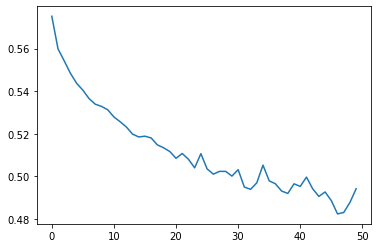

In [28]:
plt.plot(history.epoch, history.history['loss'], label='total loss')
plt.show()


This func predicts the next not in a sequence

In [29]:
def predict_next_note(
    notes: np.ndarray, 
    keras_model: tf.keras.Model, 
    temperature: float = 1.0) -> int:
    """Generates a note IDs using a trained sequence model."""

    assert temperature > 0

    # Add batch dimension
    inputs = tf.expand_dims(notes, 0)

    predictions = model.predict(inputs)
    pitch_logits = predictions['pitch']
    step = predictions['step']
    duration = predictions['duration']

    pitch_logits /= temperature
    pitch = tf.random.categorical(pitch_logits, num_samples=1)
    pitch = tf.squeeze(pitch, axis=-1)
    duration = tf.squeeze(duration, axis=-1)
    step = tf.squeeze(step, axis=-1)

    # `step` and `duration` values should be non-negative
    step = tf.maximum(0, step)
    duration = tf.maximum(0, duration)

    return int(pitch), float(step), float(duration)


Produce all the notes you requeset

In [30]:
temperature = 10.0
num_predictions = 200

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
    pitch, step, duration = predict_next_note(input_notes, model, temperature)
    start = prev_start + step
    end = start + duration
    input_note = (pitch, step, duration)
    generated_notes.append((*input_note, start, end))
    input_notes = np.delete(input_notes, 0, axis=0)
    input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
    prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))


convert back to midi format

In [31]:
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str, 
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

    prev_start = 0
    for i, note in notes.iterrows():
        start = float(prev_start + note['step'])
        end = float(start + note['duration'])
        note = pretty_midi.Note(
            velocity=velocity,
            pitch=int(note['pitch']),
            start=start,
            end=end,
        )
        instrument.notes.append(note)
        prev_start = start

    pm.instruments.append(instrument)
    pm.write(out_file)
    return pm

In [32]:
generated_notes.head(10)


,pitch,step,duration,start,end
0,76,0.09941,0.160496,0.09941,0.259907
1,14,0.00000,0.000000,0.09941,0.099410
2,26,0.00000,0.486014,0.09941,0.585425
3,89,0.00000,1.037109,0.09941,1.136520
4,33,0.00000,0.591503,0.09941,0.690913
5,82,0.00000,1.471440,0.09941,1.570851
6,71,0.00000,0.759901,0.09941,0.859311
7,68,0.00000,0.948462,0.09941,1.047873
8,94,0.00000,1.020413,0.09941,1.119823
9,77,0.00000,0.790040,0.09941,0.889451


In [33]:
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)

In [34]:
Fs = 2000
audio_data = out_pm.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)

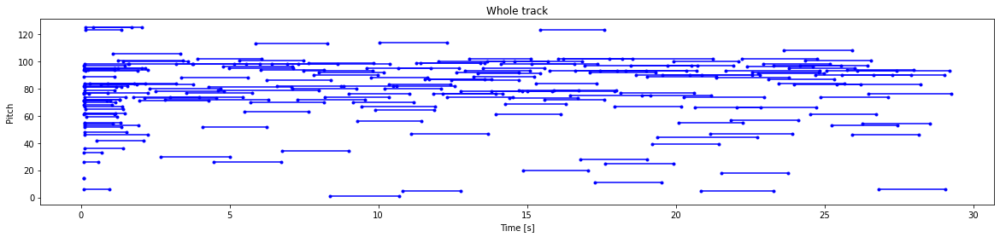

In [35]:
plot_piano_roll(generated_notes)

Try running it for longer

In [37]:
model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)

In [38]:
epochs = 100

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/100
6550/6550 [==============================] - 56s 8ms/step - loss: 0.4814 - duration_loss: 0.2558 - pitch_loss: 3.7292 - step_loss: 0.0392
Epoch 2/100
6550/6550 [==============================] - 65s 10ms/step - loss: 0.4789 - duration_loss: 0.2539 - pitch_loss: 3.7260 - step_loss: 0.0387
Epoch 3/100
6550/6550 [==============================] - 65s 10ms/step - loss: 0.4793 - duration_loss: 0.2533 - pitch_loss: 3.7292 - step_loss: 0.0395
Epoch 4/100
6550/6550 [==============================] - 65s 10ms/step - loss: 0.4926 - duration_loss: 0.2643 - pitch_loss: 3.7416 - step_loss: 0.0413
Epoch 5/100
6550/6550 [==============================] - 65s 10ms/step - loss: 0.4764 - duration_loss: 0.2515 - pitch_loss: 3.7257 - step_loss: 0.0386
Epoch 6/100
6550/6550 [==============================] - 65s 10ms/step - loss: 0.4757 - duration_loss: 0.2509 - pitch_loss: 3.7273 - step_loss: 0.0384
Epoch 7/100
6550/6550 [==============================] - 65s 10ms/step - loss: 0.4760 - duratio

In [39]:
temperature = 10.0
num_predictions = 200

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
    pitch, step, duration = predict_next_note(input_notes, model, temperature)
    start = prev_start + step
    end = start + duration
    input_note = (pitch, step, duration)
    generated_notes.append((*input_note, start, end))
    input_notes = np.delete(input_notes, 0, axis=0)
    input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
    prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

In [40]:
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)

In [41]:
Fs = 2000
audio_data = out_pm.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)

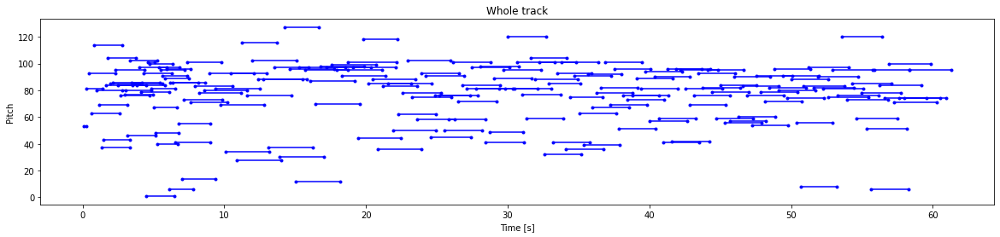

In [42]:
plot_piano_roll(generated_notes)

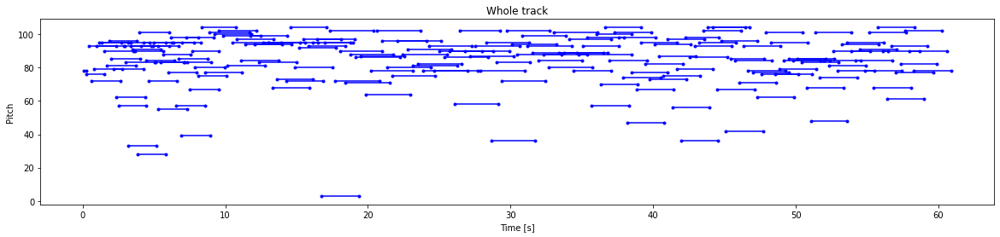

In [43]:
temperature = 5.0
num_predictions = 200

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
    pitch, step, duration = predict_next_note(input_notes, model, temperature)
    start = prev_start + step
    end = start + duration
    input_note = (pitch, step, duration)
    generated_notes.append((*input_note, start, end))
    input_notes = np.delete(input_notes, 0, axis=0)
    input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
    prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)

Fs = 2000
audio_data = out_pm.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)

plot_piano_roll(generated_notes)

In [44]:
Fs = 2000
audio_data = out_pm.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)

Here I try adding another layer

In [48]:
input_shape = (seq_length, 3)
learning_rate = 0.002
print(input_shape)
inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128, return_sequences=True)(inputs)
x = tf.keras.layers.LSTM(128)(x) 

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

(50, 3)


In [49]:
model = tf.keras.Model(inputs, outputs)
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)


In [50]:
epochs = 50

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/50
6550/6550 [==============================] - 104s 16ms/step - loss: 0.5773 - duration_loss: 0.3182 - pitch_loss: 3.9870 - step_loss: 0.0598
Epoch 2/50
6550/6550 [==============================] - 113s 17ms/step - loss: 0.5601 - duration_loss: 0.3099 - pitch_loss: 3.8610 - step_loss: 0.0571
Epoch 3/50
6550/6550 [==============================] - 112s 17ms/step - loss: 0.5510 - duration_loss: 0.3060 - pitch_loss: 3.7791 - step_loss: 0.0561
Epoch 4/50
6550/6550 [==============================] - 112s 17ms/step - loss: 0.5454 - duration_loss: 0.3029 - pitch_loss: 3.7449 - step_loss: 0.0553
Epoch 5/50
6550/6550 [==============================] - 111s 17ms/step - loss: 0.5396 - duration_loss: 0.2994 - pitch_loss: 3.7216 - step_loss: 0.0541
Epoch 6/50
6550/6550 [==============================] - 112s 17ms/step - loss: 0.5334 - duration_loss: 0.2947 - pitch_loss: 3.7092 - step_loss: 0.0532
Epoch 7/50
6550/6550 [==============================] - 112s 17ms/step - loss: 0.5279 - durati

In [68]:
temperature = 30.0
num_predictions = 200

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
    pitch, step, duration = predict_next_note(input_notes, model, temperature)
    start = prev_start + step
    end = start + duration
    input_note = (pitch, step, duration)
    generated_notes.append((*input_note, start, end))
    input_notes = np.delete(input_notes, 0, axis=0)
    input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
    prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

In [69]:
out_file = 'output2.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)

In [70]:
Fs = 2000
audio_data = out_pm.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)

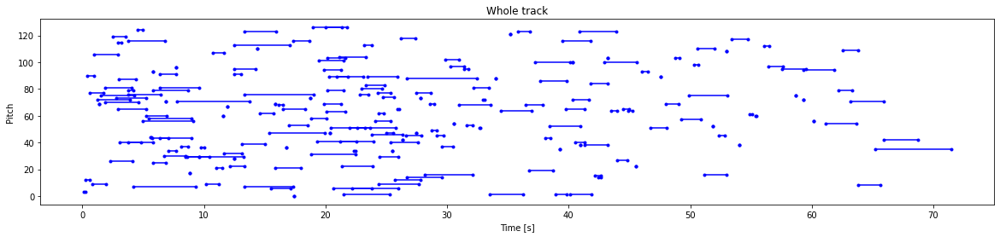

In [71]:
plot_piano_roll(generated_notes)

Here I try adding some attention

In [96]:
input_shape = (seq_length, 3)
learning_rate = 0.002
print(input_shape)
inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128, return_sequences=True)(inputs)
x = SeqSelfAttention(128, attention_activation='sigmoid')(x) 
x = tf.keras.layers.LSTM(128)(x)
outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

(50, 3)


In [97]:
model = tf.keras.Model(inputs, outputs)
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)


In [98]:
epochs = 50

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/50
6550/6550 [==============================] - 318s 48ms/step - loss: 0.5978 - duration_loss: 0.3359 - pitch_loss: 4.0065 - step_loss: 0.0616
Epoch 2/50
6550/6550 [==============================] - 316s 48ms/step - loss: 0.5735 - duration_loss: 0.3179 - pitch_loss: 3.9068 - step_loss: 0.0602
Epoch 3/50
6550/6550 [==============================] - 316s 48ms/step - loss: 0.5659 - duration_loss: 0.3123 - pitch_loss: 3.8773 - step_loss: 0.0597
Epoch 4/50
6550/6550 [==============================] - 316s 48ms/step - loss: 0.5604 - duration_loss: 0.3090 - pitch_loss: 3.8424 - step_loss: 0.0593
Epoch 5/50
6550/6550 [==============================] - 317s 48ms/step - loss: 0.5556 - duration_loss: 0.3062 - pitch_loss: 3.8092 - step_loss: 0.0589
Epoch 6/50
6550/6550 [==============================] - 322s 49ms/step - loss: 0.5516 - duration_loss: 0.3033 - pitch_loss: 3.7896 - step_loss: 0.0588
Epoch 7/50
6550/6550 [==============================] - 322s 49ms/step - loss: 0.5500 - durati

In [124]:
temperature = 10.0
num_predictions = 300

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
    pitch, step, duration = predict_next_note(input_notes, model, temperature)
    start = prev_start + step
    end = start + duration
    input_note = (pitch, step, duration)
    generated_notes.append((*input_note, start, end))
    input_notes = np.delete(input_notes, 0, axis=0)
    input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
    prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

In [125]:
out_file = 'output3.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)

In [126]:
Fs = 2000
audio_data = out_pm.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)

Here I try two layers with attention and a lower learing rate

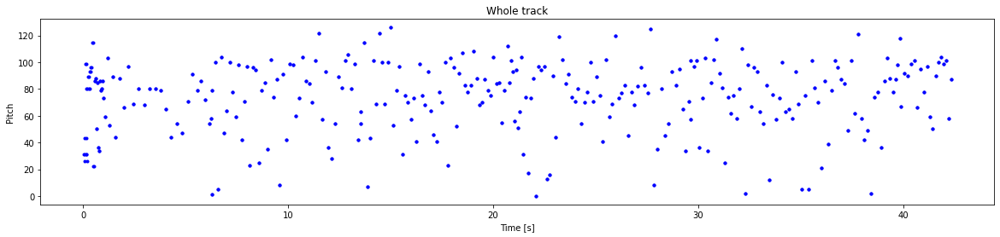

In [127]:
plot_piano_roll(generated_notes)input_shape = (seq_length, 3)
learning_rate = 0.002
print(input_shape)
inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128, return_sequences=True)(inputs)
x = SeqSelfAttention(128, attention_activation='sigmoid')(x) 
x = tf.keras.layers.LSTM(128)(x)
outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

In [337]:
num_files = 60
all_notes = []
filenames = glob.glob("E:/Datasets/midis_v1.1/*.mid")
random.shuffle(filenames)
for f in tqdm(filenames[:60]):
    notes = midi_to_notes(f)
    all_notes.append(notes)

all_notes = pd.concat(all_notes)

100%|██████████████████████████████████████████████████████████████████████████████████| 60/60 [00:09<00:00,  6.29it/s]


In [338]:
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)

notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

TensorSpec(shape=(3,), dtype=tf.float64, name=None)

In [339]:
seq_length = 50
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

(TensorSpec(shape=(50, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})

In [340]:
for seq, target in seq_ds.take(1):
    print('sequence shape:', seq.shape)
    print('sequence elements (first 10):', seq[0: 10])
    print()
    print('target:', target)

sequence shape: (50, 3)
sequence elements (first 10): tf.Tensor(
[[0.484375   0.         0.17838542]
 [0.3515625  0.00651042 0.17708333]
 [0.515625   0.         0.17838542]
 [0.296875   0.00130208 0.171875  ]
 [0.578125   0.52734375 0.20703125]
 [0.515625   0.00130208 0.20572917]
 [0.484375   0.         0.20963542]
 [0.390625   0.00260417 0.01432292]
 [0.296875   0.         0.19921875]
 [0.3515625  0.         0.20442708]], shape=(10, 3), dtype=float64)

target: {'pitch': <tf.Tensor: shape=(), dtype=float64, numpy=69.0>, 'step': <tf.Tensor: shape=(), dtype=float64, numpy=0.0013020833333339255>, 'duration': <tf.Tensor: shape=(), dtype=float64, numpy=0.07421875>}


In [341]:
batch_size = 150
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

Now I tried bidirection LSTM then attention then LSTM with dropout between those

In [144]:
input_shape = (seq_length, 3)
learning_rate = 0.002
print(input_shape)
inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True))(inputs)
x = SeqSelfAttention(128, attention_activation='sigmoid')(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.LSTM(128)(x)
x = tf.keras.layers.Dropout(0.3)(x)
outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

(50, 3)


In [145]:
model = tf.keras.Model(inputs, outputs)
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)


In [146]:
epochs = 50

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/50
1281/1281 [==============================] - 199s 138ms/step - loss: 0.5482 - duration_loss: 0.2775 - pitch_loss: 4.0829 - step_loss: 0.0666
Epoch 2/50
1281/1281 [==============================] - 177s 138ms/step - loss: 0.5203 - duration_loss: 0.2568 - pitch_loss: 3.9747 - step_loss: 0.0647
Epoch 3/50
1281/1281 [==============================] - 177s 138ms/step - loss: 0.5131 - duration_loss: 0.2538 - pitch_loss: 3.9161 - step_loss: 0.0635
Epoch 4/50
1281/1281 [==============================] - 177s 138ms/step - loss: 0.5086 - duration_loss: 0.2518 - pitch_loss: 3.8877 - step_loss: 0.0624
Epoch 5/50
1281/1281 [==============================] - 177s 138ms/step - loss: 0.5046 - duration_loss: 0.2500 - pitch_loss: 3.8643 - step_loss: 0.0614
Epoch 6/50
1281/1281 [==============================] - 177s 138ms/step - loss: 0.5014 - duration_loss: 0.2485 - pitch_loss: 3.8436 - step_loss: 0.0607
Epoch 7/50
1281/1281 [==============================] - 178s 139ms/step - loss: 0.4985 -

In [151]:
temperature = 50.0
num_predictions = 300

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
    pitch, step, duration = predict_next_note(input_notes, model, temperature)
    start = prev_start + step
    end = start + duration
    input_note = (pitch, step, duration)
    generated_notes.append((*input_note, start, end))
    input_notes = np.delete(input_notes, 0, axis=0)
    input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
    prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

In [152]:
out_file = 'output3.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)

In [153]:
Fs = 2000
audio_data = out_pm.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)

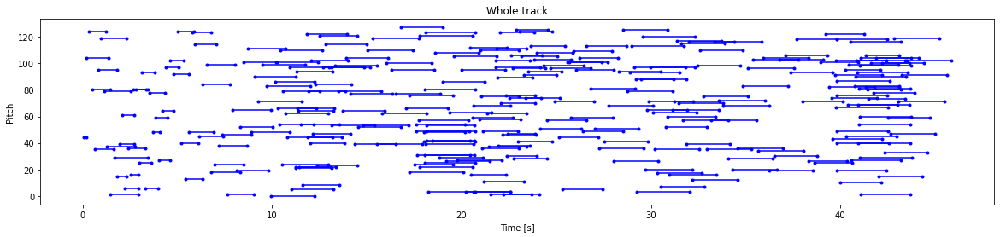

In [154]:
plot_piano_roll(generated_notes)

Here I experimented a lot. I tried many differnt dataset. The one I have here is solo piano pieces from chopin but I also tried some by bech and some jazz solo pieces as well. I did about 40 - 50 hours of training total. I also messed a lot with the loss weights and the loss function to see what effect that would have on the output.

In [713]:
num_files = 15
all_notes = []
filenames = glob.glob("E:\Datasets\chopin/*.mid")
#filenames = ["E:\Datasets\chopin/chpn_op33_2.mid"]
random.shuffle(filenames)
for f in tqdm(filenames[:num_files]):
    notes = midi_to_notes(f)
    all_notes.append(notes)

all_notes = pd.concat(all_notes)

100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.47it/s]


In [714]:
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)

notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

TensorSpec(shape=(3,), dtype=tf.float64, name=None)

In [715]:
seq_length = 100
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

(TensorSpec(shape=(100, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})

In [716]:
batch_size = 75
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [717]:
input_shape = (seq_length, 3)
learning_rate = 0.001
print(input_shape)
inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences=True))(inputs)
x = SeqSelfAttention(100, attention_activation='sigmoid')(x)
x = tf.keras.layers.Dropout(0.3)(x)
x = tf.keras.layers.LSTM(100)(x)
x = tf.keras.layers.Dropout(0.3)(x)
outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

(100, 3)


In [718]:
model = tf.keras.Model(inputs, outputs)
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.05,
        'step': 1.0,
        'duration':1.0,
    },
    optimizer=optimizer,
)

In [721]:
epochs = 60

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/60
157/157 [==============================] - 33s 207ms/step - loss: 0.9795 - duration_loss: 0.1138 - pitch_loss: 3.7604 - step_loss: 0.6776
Epoch 2/60
157/157 [==============================] - 33s 207ms/step - loss: 0.9704 - duration_loss: 0.1101 - pitch_loss: 3.7378 - step_loss: 0.6735
Epoch 3/60
157/157 [==============================] - 33s 207ms/step - loss: 0.9705 - duration_loss: 0.1082 - pitch_loss: 3.7230 - step_loss: 0.6762
Epoch 4/60
157/157 [==============================] - 33s 207ms/step - loss: 0.9652 - duration_loss: 0.1068 - pitch_loss: 3.7124 - step_loss: 0.6728
Epoch 5/60
157/157 [==============================] - 33s 208ms/step - loss: 0.9611 - duration_loss: 0.1051 - pitch_loss: 3.7123 - step_loss: 0.6704
Epoch 6/60
157/157 [==============================] - 33s 208ms/step - loss: 0.9529 - duration_loss: 0.1033 - pitch_loss: 3.6996 - step_loss: 0.6646
Epoch 7/60
157/157 [==============================] - 33s 208ms/step - loss: 0.9520 - duration_loss: 0.101

In [726]:
temperature = 1.1
num_predictions = 200

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
    pitch, step, duration = predict_next_note(input_notes, model, temperature)
    start = prev_start + step
    end = start + duration
    input_note = (pitch, step, duration)
    generated_notes.append((*input_note, start, end))
    input_notes = np.delete(input_notes, 0, axis=0)
    input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
    prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

In [728]:
out_file = 'output15.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)

In [729]:
Fs = 2000
audio_data = out_pm.synthesize(fs=Fs)
Audio(audio_data, rate=Fs)

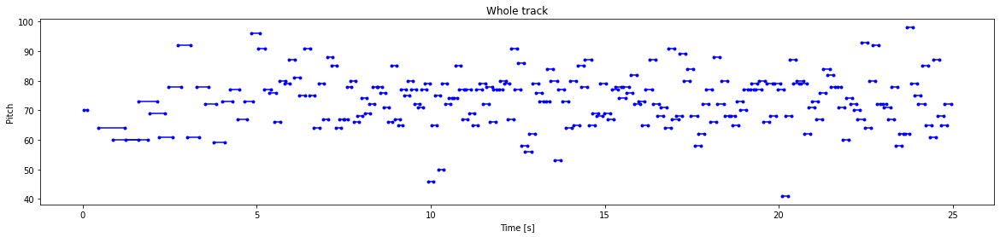

In [730]:
plot_piano_roll(generated_notes)

# Conclusion

I have to way that this project was a mild success because I was able to generate something that sounded vaugely like music. I did feel like I was able to learn more about RNNs and how they work practically. I also learned a lot about how to tune parametes better and how to test generated data for quality. 

I also leared a lot about hte state-of-the-art methods like GANs and transformers while doing research for this project. If  I had some more time and resources I whould love to try this again with those archutectures. 

One thing I might have changed was the note representation. Many peopel online reperesented theirs in a note formate which is a combination of the pitch and lenght. They just generated them one at a time. I think that while that may be more limited it proboly would broduce some better results. I only discovered that way near the end though. 

Overall great class and great project. I really had a lot of fun a learned a ton.